# Multiclass classification Problem

The goal in this notebook is to show some algorithms/techniques in practice based on a recent Kaggle competition I joined for learning purposes.

In this competition I was asked to predict the forest cover type (the predominant kind of tree cover) from strictly cartographic variables (as opposed to remotely sensed data). The actual forest cover type for a given 30 x 30 meter cell was determined from US Forest Service (USFS) Region 2 Resource Information System data. Independent variables were then derived from data obtained from the US Geological Survey and USFS. The data is in raw form (not scaled) and contains binary columns of data for qualitative independent variables such as wilderness areas and soil type.

This study area includes four wilderness areas located in the Roosevelt National Forest of northern Colorado. These areas represent forests with minimal human-caused disturbances, so that existing forest cover types are more a result of ecological processes rather than forest management practices.

**Target:** I was asked to predict an integer classification for the forest cover type. The seven types are:

1. Spruce/Fir
2. Lodgepole Pine
3. Ponderosa Pine
4. Cottonwood/Willow
5. Aspen (no observations in my dataset)
6. Douglas-fir
7. Krummholz

For further information on each variable please refer to "Data Fields" https://www.kaggle.com/c/forest-cover-type-prediction/data
    
**Evaluation metric:** Submissions were evaluated on multi-class classification accuracy.  

In [1]:
import pandas as pd
df=pd.read_csv('train_forest.csv')
df=df[:2000000] # I have shortened the dataset to reduce processing time
df=df.drop('Id',axis=1) # removed for not being explanatory

### Pandas Profiling is a very useful tool to have a quick overview of the data for exploratory purposes

In [10]:
from pandas_profiling import ProfileReport
report = ProfileReport(df, title = "Forest Cover Type")
report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

* Soil Type 7 and Soil Type 15 can be dropped from the dataframe as they add no information
* The target variable is imbalanced so maybe resampling could be necessary

# Training, Validation (Test) and Holdout set

In [2]:
cols=['Soil_Type7','Soil_Type15']
df=df.drop(cols,axis=1)
y=df['Cover_Type']
X=df.drop('Cover_Type',axis=1)
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=.5,random_state=1)
X_test,X_hold,y_test,y_hold=train_test_split(X_test,y_test,test_size=.5,random_state=1)

# Logistic Regression

This is a good baseline model to start with. We will need to scale the features first, this step will not be necessary for the tree based models we will work with later.

In [26]:
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
import time

scaler=StandardScaler()
scaler.fit(X_train)

X_train_tr=scaler.transform(X_train)
X_test_tr=scaler.transform(X_test)

lr=LogisticRegression(solver='liblinear',multi_class='ovr',C=0.05,random_state=0)

start=time.time()
lr.fit(X_train_tr,y_train)
end=time.time()
print(end-start)
print('Training Accuracy:',lr.score(X_train_tr,y_train))
print('Test Accuracy:',lr.score(X_test_tr,y_test))

153.382981300354
Training Accuracy: 0.912455
Test Accuracy: 0.91254


# Random Forest

This is an ensemble method, that builds multiple independent decision trees and merges them together to get a more accurate and stable prediction

In [16]:
from sklearn.ensemble import RandomForestClassifier

rf= RandomForestClassifier(n_estimators=100,class_weight='balanced',random_state=1)

start=time.time()
rf.fit(X_train, y_train)
end=time.time()
print(end-start)
print('Training Accuracy:',rf.score(X_train,y_train))
print('Test Accuracy:',rf.score(X_test,y_test))

1007.6900770664215
Training Accuracy: 1.0
Test Accuracy: 0.958382


Clearly the model is overfitting, it has become so complex that it is no good for predicting. Let us "prune" the trees with max_depth hyperparameter.

In [18]:
from sklearn.ensemble import RandomForestClassifier

rf= RandomForestClassifier(n_estimators=100,max_depth=10,class_weight='balanced',random_state=1)

start=time.time()
rf.fit(X_train, y_train)
end=time.time()
print(end-start)
print('Training Accuracy:',rf.score(X_train,y_train))
print('Test Accuracy:',rf.score(X_test,y_test))

409.0740568637848
Training Accuracy: 0.841395
Test Accuracy: 0.840112


Overfitting has improved, however, accuracy has fallen below the one obtained with Logistic Regression.

# XGBoost

In contrast with Random Forest, XGBoost builds one tree at a time using the gradient descent algorithm, therefore each tree is built making an improvement from the last tree. That is why we will need to choose a learning rate in this case.

In [21]:
import xgboost as xgb

xgbmodel=xgb.XGBClassifier(eval_metric='merror',learning_rate=0.25,n_estimators=100,objective='multi:softmax', 
                        num_classes=6, random_state=0)

start=time.time()
xgbmodel.fit(X_train, y_train)
end=time.time()
print(end-start)


3917.7496688365936


In [22]:
from sklearn.metrics import accuracy_score

xgbmpredtrain=xgbmodel.predict(X_train)
xgbmpredtest=xgbmodel.predict(X_test)

print('Training Accuracy:',accuracy_score(xgbmpredtrain,y_train))
print('Test Accuracy:',accuracy_score(xgbmpredtest,y_test))

Training Accuracy: 0.95345
Test Accuracy: 0.95265


There is an improvement compared to random forest. We could play even more tuning the hyperparameters but we will leave that for Light GBM as it is faster.

# Light GBM

Light GBM as XGBoost is based on decision trees within the gradient boosting framework, however it splits the tree leaf wise with the best fit whereas XGBoost splits the tree level wise. This leaf-wise approach reduces more loss than the level-wise algorithm driving to better accuracy and making it surprisingly fast, that is why it is called ‘Light’.
We will use GridSearchCV which will help us try different models with different hyperparameters scenarios and help us chose the best parameters.

In [34]:
import warnings
warnings.filterwarnings("ignore")

lgbmcv = LGBMClassifier(
    objective="multiclass",
    num_class=6,
    random_state=0,
    feature_fraction=0.8,
    bagging_fraction=0.8,
    bagging_freq=100,
    reg_alpha=10,
    n_estimators=100,
    boosting="gbdt", 
)

parameters = {
    'max_depth': [5, 7, 10, 12],
    'learning_rate':[0.02,0.05,0.15,0.3]
}


cv= GridSearchCV(lgbmcv, param_grid = parameters, n_jobs=6,verbose=10)
cv.fit(X_train,y_train)
 

print('best params:',cv.best_params_)

preds_train = cv.predict(X_train)
preds_test = cv.predict(X_test)
print('Training Accuracy:',accuracy_score(preds_train,y_train))
print('Test Accuracy:',accuracy_score(preds_test,y_test))

Fitting 5 folds for each of 16 candidates, totalling 80 fits
best params: {'learning_rate': 0.15, 'max_depth': 12}
Training Accuracy: 0.962237
Test Accuracy: 0.960708


# Multi Layer Perceptron

Let us try at last Multi Layer perceptron, this is the "off the shelf" solution available in SKLearn based on neural networks. 
It is not very flexible, in the sense that you can choose the layers but these layers will all have the same amount of neurons. In this case I have chosen two layers with 20 neurons each.
We will need scaling first

In [16]:
from sklearn.neural_network import MLPClassifier
from sklearn.preprocessing import StandardScaler

scaler=StandardScaler()
scaler.fit(X_train)

X_train_tr=scaler.transform(X_train)
X_test_tr=scaler.transform(X_test)

start=time.time()
mlp = MLPClassifier(alpha=0.01,hidden_layer_sizes=(20,2),learning_rate='adaptive',activation="relu",random_state=1)
mlp.fit(X_train_tr, y_train)
end=time.time()
print(end-start)
print('Training Accuracy:',mlp.score(X_train_tr,y_train))
print('Test Accuracy:',mlp.score(X_test_tr,y_test))


449.10581398010254
Training Accuracy: 0.95605
Test Accuracy: 0.955348


We could tune some parameters but a priori we would not be getting an improvement compared to LightGBM

# Confusion Matrix

To get further insight on how well our chosen model LightGBM is predicting, we can use the confusion matrix.
It provides information about our classifier performance, matching suitably classified observations corresponding to misclassified ones.

In [50]:
from sklearn.metrics import confusion_matrix, classification_report
from matplotlib import pyplot as plt
import seaborn as sns

def plot_confusion_matrix(cm, classes,
                          normalize=True,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    import itertools
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.tight_layout()

Normalized confusion matrix
[[9.63e-01 3.15e-02 0.00e+00 0.00e+00 1.08e-05 5.48e-03]
 [2.06e-02 9.75e-01 4.62e-03 0.00e+00 1.63e-04 1.29e-04]
 [0.00e+00 1.77e-01 8.01e-01 1.47e-04 2.20e-02 0.00e+00]
 [0.00e+00 0.00e+00 6.25e-01 2.50e-01 1.25e-01 0.00e+00]
 [0.00e+00 1.23e-01 4.85e-01 0.00e+00 3.93e-01 0.00e+00]
 [3.38e-01 3.75e-03 0.00e+00 0.00e+00 0.00e+00 6.58e-01]]


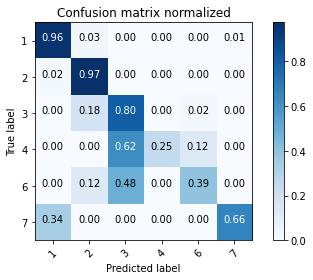

In [51]:
cnf_matrix = confusion_matrix(y_test, preds_test,labels=[1,2,3,4,6,7])
import numpy as np
np.set_printoptions(precision=2)

# Plot confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=[1,2,3,4,6,7],title='Confusion matrix normalized')

In [52]:
df['Cover_Type'].value_counts()

2    1177534
1     738670
3      55041
7      26475
6       2239
4         41
Name: Cover_Type, dtype: int64

Cover Types 4 and 6 predictions need improvement with only 25% and 39% of true positives respectively, however they have low weight in the database (cover type 4 only has 41 observations in the dataset!) that explains their low impact on overall accuracy

# Holdout Set: let us see if our model (LightGBM) generalizes well

In [54]:
holdout_predictions=cv.predict(X_hold)
print('Holdout Accuracy:',accuracy_score(holdout_predictions,y_hold))

Holdout Accuracy: 0.960738


Accuracy score is very close to what we were expecting. Our model seems to be quite predictive, mostly for cover types 1 2 and 3 as reflected on the confusion matrix.